In [1]:
from model.config import cfg
from model.test import im_detect
from model.nms_wrapper import nms

from utils.timer import Timer
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import os, cv2
import argparse

In [2]:
# CLASSES = ('__background__',
#            'aeroplane', 'bicycle', 'bird', 'boat',
#            'bottle', 'bus', 'car', 'cat', 'chair',
#            'cow', 'diningtable', 'dog', 'horse',
#            'motorbike', 'person', 'pottedplant',
#            'sheep', 'sofa', 'train', 'tvmonitor')

CLASSES = ('background','person','bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush')

NETS = {'vgg16': ('vgg16_faster_rcnn_iter_70000.ckpt',),
        'res101': ('res101_faster_rcnn_iter_110000.ckpt',),
        'res152': ('res152_faster_rcnn_iter_1190000.ckpt')}

DATASETS= {'pascal_voc': ('voc_2007_trainval',),
           'pascal_voc_0712': ('voc_2007_trainval+voc_2012_trainval',), 
           'coco_2017': ('coco_2014_train+coco_2014_valminusminival',)}

# NETS = {'vgg16': ('vgg16_faster_rcnn_iter_1190000.ckpt',),'res101': ('res101_faster_rcnn_iter_1190000.ckpt',)}
# DATASETS= {'coco_2014': ('coco_2014_train+coco_2014_valminusminival',)}

In [3]:
len(CLASSES)

81

In [4]:
cfg.TEST.HAS_RPN = True  # Use RPN for proposals
# args = parse_args()

# # model path
# demonet = args.demo_net
# dataset = args.dataset
tfmodel = os.path.join('../output', 'res152', DATASETS['coco_2017'][0], 'default',
                          NETS['res152'])
print(tfmodel)

../output/res152/coco_2014_train+coco_2014_valminusminival/default/res152_faster_rcnn_iter_1190000.ckpt


In [5]:
# set config
tfconfig = tf.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth=True

# init session
sess = tf.Session(config=tfconfig)

In [6]:
from nets.vgg16 import vgg16
from nets.resnet_v1 import resnetv1

# net = resnetv1(num_layers=101)
net = resnetv1(num_layers=152)

In [7]:
net.create_architecture("TEST", 81, tag='default', anchor_scales=[4,8,16,32])
# net.create_architecture("TEST", 21, tag='default', anchor_scales=[8,16,32])

{'rois': <tf.Tensor 'resnet_v1_152_3/rois/concat:0' shape=(?, 5) dtype=float32>,
 'rpn_cls_score': <tf.Tensor 'resnet_v1_152_3/rpn_cls_score/BiasAdd:0' shape=(1, ?, ?, 24) dtype=float32>,
 'rpn_cls_score_reshape': <tf.Tensor 'resnet_v1_152_3/rpn_cls_score_reshape/transpose_1:0' shape=(1, ?, ?, 2) dtype=float32>,
 'rpn_cls_prob': <tf.Tensor 'resnet_v1_152_3/rpn_cls_prob/transpose_1:0' shape=(1, ?, ?, 24) dtype=float32>,
 'rpn_cls_pred': <tf.Tensor 'resnet_v1_152_3/rpn_cls_pred:0' shape=(?,) dtype=int64>,
 'rpn_bbox_pred': <tf.Tensor 'resnet_v1_152_3/rpn_bbox_pred/BiasAdd:0' shape=(1, ?, ?, 48) dtype=float32>,
 'cls_score': <tf.Tensor 'resnet_v1_152_5/cls_score/BiasAdd:0' shape=(?, 81) dtype=float32>,
 'cls_pred': <tf.Tensor 'resnet_v1_152_5/cls_pred:0' shape=(?,) dtype=int64>,
 'cls_prob': <tf.Tensor 'resnet_v1_152_5/cls_prob:0' shape=(?, 81) dtype=float32>,
 'bbox_pred': <tf.Tensor 'add:0' shape=(?, 324) dtype=float32>}

In [8]:
saver = tf.train.Saver()
saver.restore(sess, tfmodel)

INFO:tensorflow:Restoring parameters from ../output/res152/coco_2014_train+coco_2014_valminusminival/default/res152_faster_rcnn_iter_1190000.ckpt


In [9]:
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.inception_v3 import preprocess_input
from keras.utils.data_utils import GeneratorEnqueuer
import matplotlib.pyplot as plt
import pandas as pd 
import numpy as np 
import math, os

%matplotlib inline

Using TensorFlow backend.


In [10]:
image_path = "../test/"

batch_size = 100
img_generator = ImageDataGenerator().flow_from_directory(image_path, shuffle=False, batch_size = batch_size)
n_rounds = math.ceil(img_generator.samples / img_generator.batch_size)
filenames = img_generator.filenames

img_generator = GeneratorEnqueuer(img_generator)
img_generator.start()
img_generator = img_generator.get()

Found 99999 images belonging to 1 classes.


In [165]:
def vis_detections(im, class_name, dets, thresh=0.5):
    """Draw detected bounding boxes."""
    inds = np.where(dets[:, -1] >= thresh)[0]
    if len(inds) == 0:
        return

    im = im[:, :, (2, 1, 0)]
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.imshow(im, aspect='equal')
    for i in inds:
        bbox = dets[i, :4]
        score = dets[i, -1]

        ax.add_patch(
            plt.Rectangle((bbox[0], bbox[1]),
                          bbox[2] - bbox[0],
                          bbox[3] - bbox[1], fill=False,
                          edgecolor='red', linewidth=3.5)
            )
        ax.text(bbox[0], bbox[1] - 2,
                '{:s} {:.3f}'.format(class_name, score),
                bbox=dict(facecolor='blue', alpha=0.5),
                fontsize=14, color='white')

    ax.set_title(('{} detections with '
                  'p({} | box) >= {:.1f}').format(class_name, class_name,
                                                  thresh),
                  fontsize=14)
    plt.axis('off')
    plt.tight_layout()
    plt.draw()

In [174]:
def demo(sess, net, image_name):
    """Detect object classes in an image using pre-computed object proposals."""

    # Load the demo image
    im = cv2.imread(image_name)
    
    # Detect all object classes and regress object bounds
    timer = Timer()
    timer.tic()
    scores, boxes = im_detect(sess, net, im)
    timer.toc()
    print('Detection took {:.3f}s for {:d} object proposals'.format(timer.total_time, boxes.shape[0]))

    # Visualize detections for each class
    CONF_THRESH = 0.8
    NMS_THRESH = 0.3
    
    fig, ax = plt.subplots(figsize=(12, 12))
    im = im[:, :, (2, 1, 0)] 
#     ax.imshow(im, aspect='equal')
    
    for cls_ind, cls in enumerate(CLASSES[1:]):
        cls_ind += 1 # because we skipped background
        cls_boxes = boxes[:, 4*cls_ind:4*(cls_ind + 1)]
        cls_scores = scores[:, cls_ind]
        dets = np.hstack((cls_boxes,
                          cls_scores[:, np.newaxis])).astype(np.float32)
        keep = nms(dets, NMS_THRESH)
        dets = dets[keep, :]
#         vis_detections(copy_im, cls, dets, thresh=CONF_THRESH)

        inds = np.where(dets[:, -1] >= CONF_THRESH)[0]

        for i in inds:
            bbox = dets[i, :4]
            score = dets[i, -1]
            
#             im = boxing(im, bbox, score, cls)
           
    
            ax.add_patch(
                plt.Rectangle((bbox[0], bbox[1]),
                              bbox[2] - bbox[0],
                              bbox[3] - bbox[1], fill=False,
                              edgecolor='red', linewidth=3.5)
                )
            ax.text(bbox[0], bbox[1] - 2,
                    '{:s} {:.3f}'.format(cls, score),
                    bbox=dict(facecolor='blue', alpha=0.5),
                    fontsize=14, color='white')

    ax.imshow(im, aspect='equal') 


Detection took 0.130s for 300 object proposals
Detection took 0.118s for 300 object proposals
Detection took 0.108s for 300 object proposals
Detection took 0.111s for 300 object proposals
Detection took 0.108s for 300 object proposals
Detection took 0.112s for 300 object proposals
Detection took 0.122s for 300 object proposals
Detection took 0.110s for 300 object proposals
Detection took 0.112s for 300 object proposals
Detection took 0.096s for 300 object proposals
Detection took 0.128s for 300 object proposals
Detection took 0.117s for 300 object proposals
Detection took 0.114s for 300 object proposals
Detection took 0.108s for 300 object proposals
Detection took 0.109s for 300 object proposals
Detection took 0.094s for 300 object proposals
Detection took 0.105s for 300 object proposals
Detection took 0.105s for 300 object proposals
Detection took 0.109s for 300 object proposals
Detection took 0.110s for 300 object proposals
Detection took 0.101s for 300 object proposals
Detection too

/home/chansung/.local/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


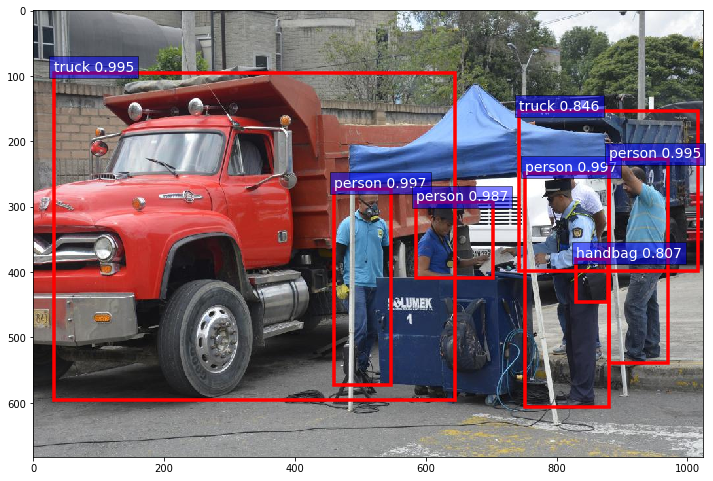

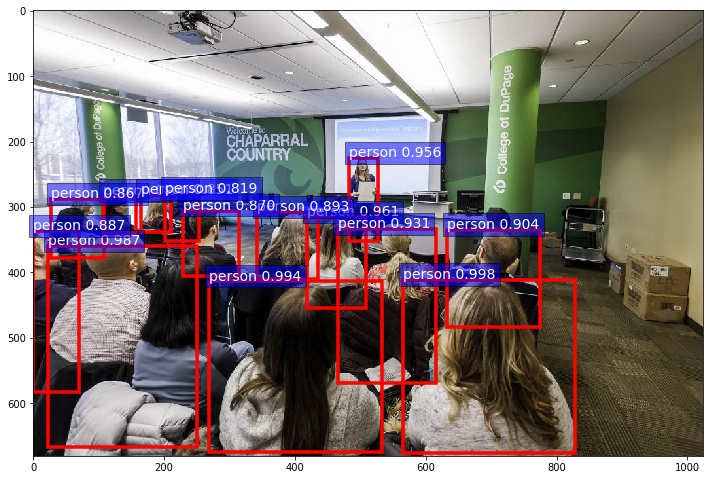

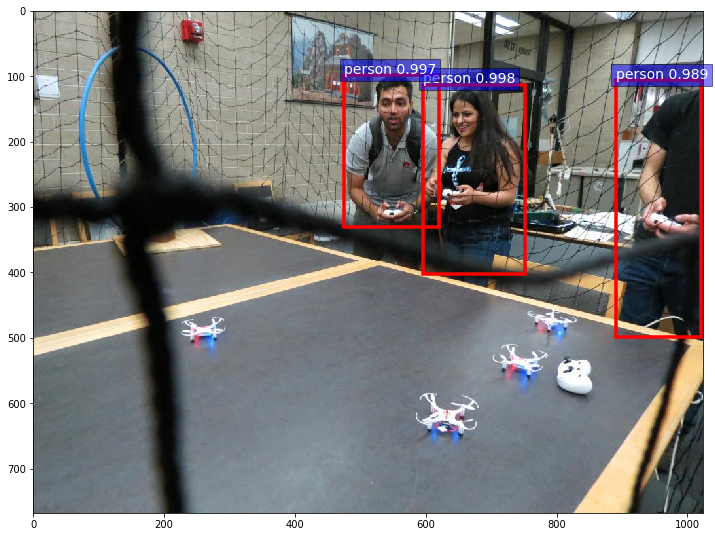

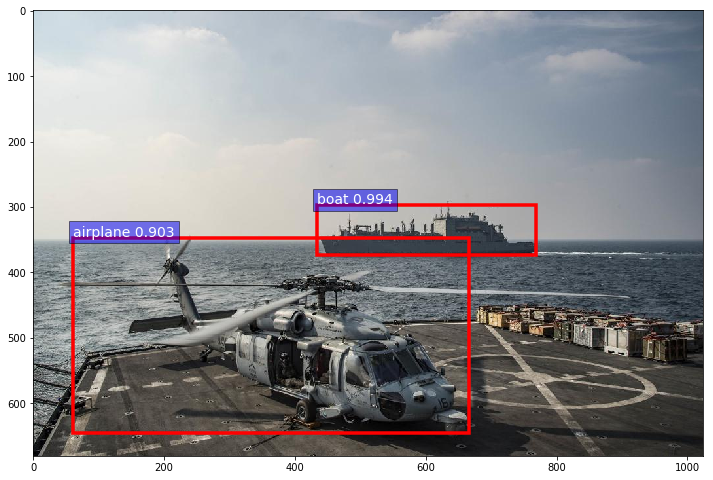

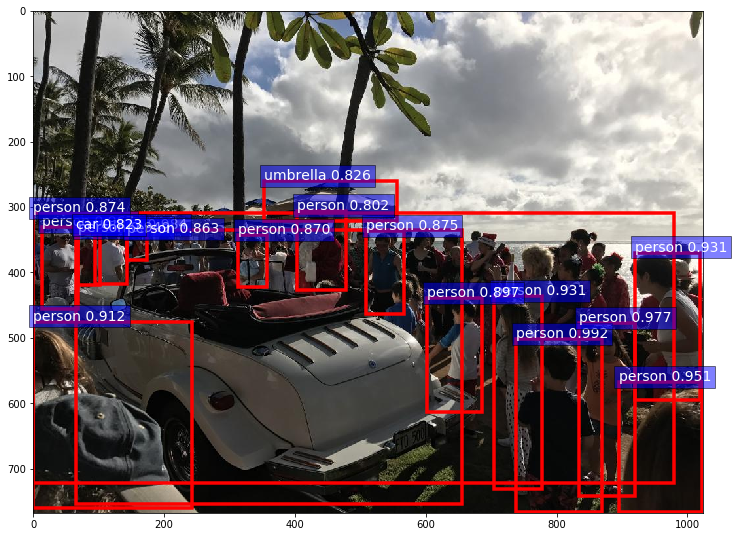

...

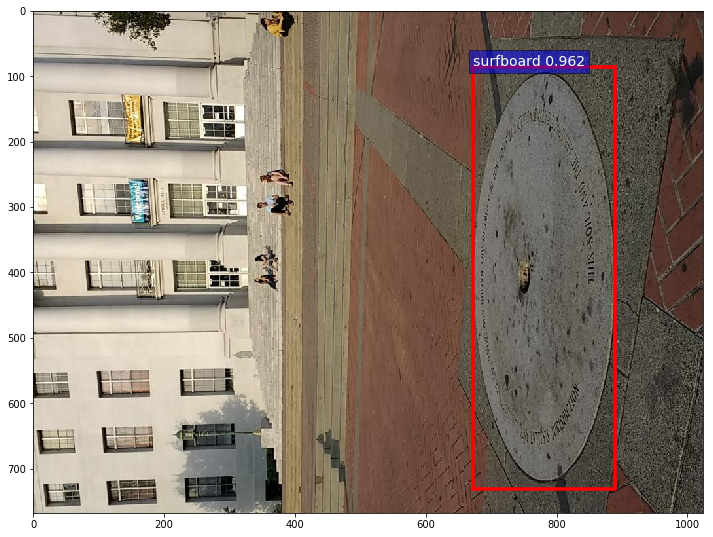

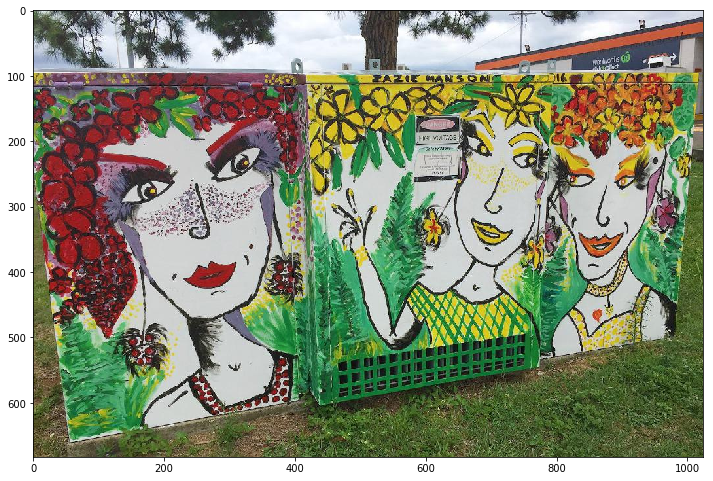

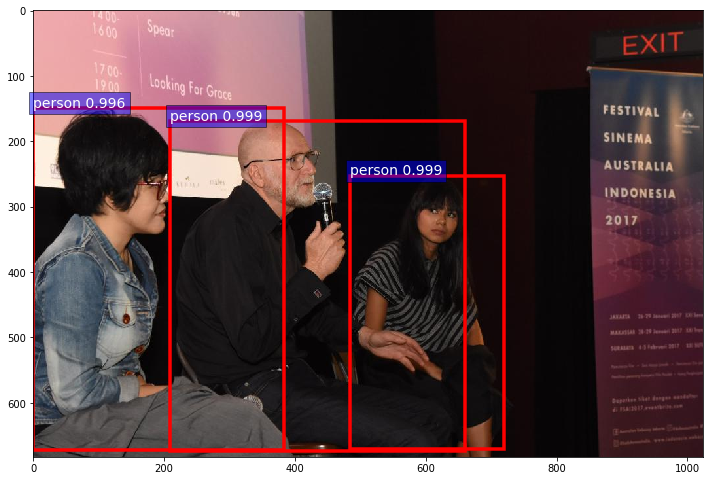

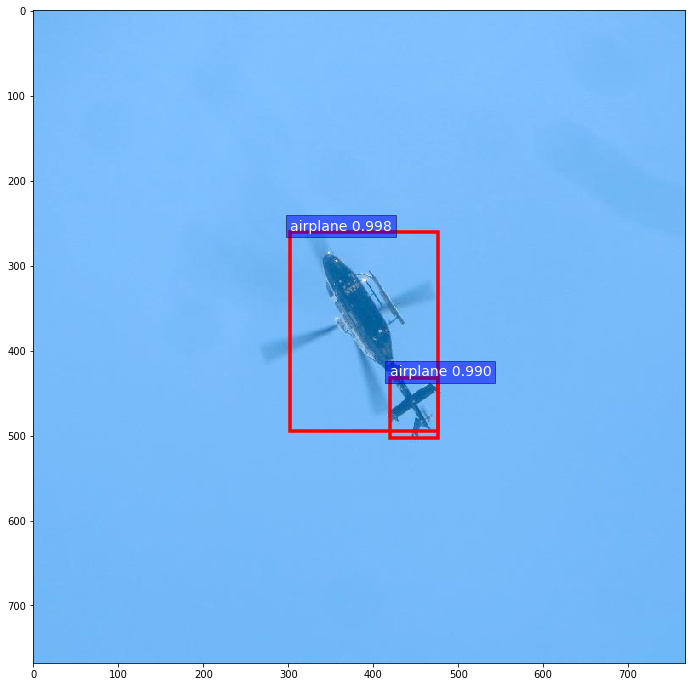

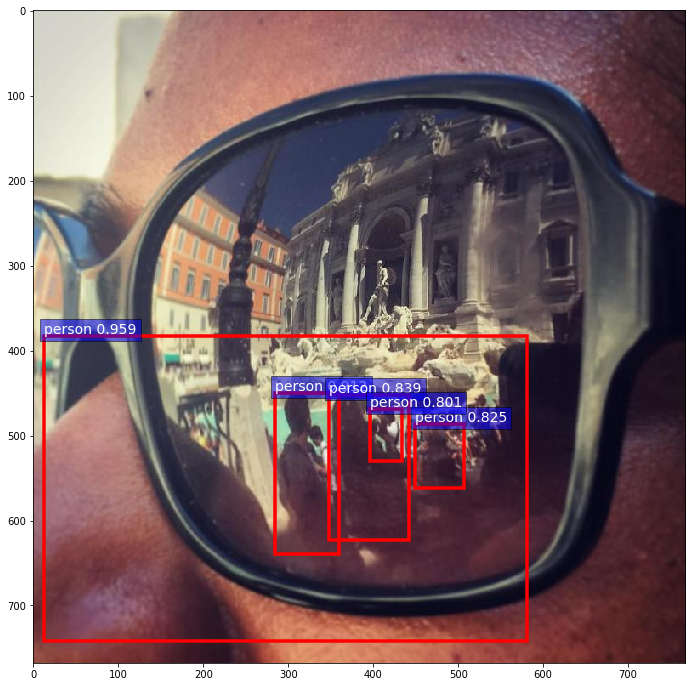

In [175]:
for i in range(n_rounds):
    batch = next(img_generator)
    for j, prediction in enumerate(batch):
        image = filenames[i * batch_size + j]
        image = "../test/" + image

        demo(sess, net, image)

    if i == 10:
        break